In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv("/content/7.csv",header=None)
print(df.head())
print(df.shape)

      0     1       2
0  0.94  0.50  3.0155
1  0.64  0.40  2.2984
2  0.60  0.55  2.4300
3  0.58  0.32  2.2020
4  0.58  0.19  2.0078
(10201, 3)


In [ ]:
df_X=df.iloc[:,:-1]
df_y=df.iloc[:,-1]
print(df_X.shape)
print(df_y.shape)

(10201, 2)
(10201,)


In [ ]:
split_index = int(len(df) * 0.7)
df_X_train = df_X[:split_index]
df_X_test = df_X[split_index:]
df_y_train = df_y[:split_index]
df_y_test = df_y[split_index:]
print(df_X_train.shape)
print(df_X_test.shape)
print(df_y_train.shape)
print(df_y_test.shape)


(7140, 2)
(3061, 2)
(7140,)
(3061,)


In [ ]:
# def k_means(X, k, max_iter=100):
#     # Initialize cluster centers randomly from the data points
#     centers = X[np.random.choice(range(len(X)), k, replace=False)]
#     for _ in range(max_iter):
#         # Assign points to the nearest cluster center
#         clusters = [[] for _ in range(k)]
#         for x in X:
#             distances = [np.linalg.norm(x - center) for center in centers]
#             cluster_index = np.argmin(distances)
#             clusters[cluster_index].append(x)
#         # Update cluster centers
#         new_centers = np.array([np.mean(cluster, axis=0) for cluster in clusters])
#         if np.all(centers == new_centers):
#             break
#         centers = new_centers
#     return centers

# def k_means(X, k, max_iter=10000, tol=1e-15):
#     # Initialize cluster centers randomly from the data points
#     centers = X[np.random.choice(range(len(X)), k, replace=False)]

#     for _ in range(max_iter):
#         # Assign points to the nearest cluster center
#         clusters = [[] for _ in range(k)]
#         for x in X:
#             distances = [np.linalg.norm(x - center) for center in centers]
#             cluster_index = np.argmin(distances)
#             clusters[cluster_index].append(x)

#         # Update cluster centers
#         new_centers = np.array([np.mean(cluster, axis=0) if len(cluster) > 0 else centers[i]
#                                 for i, cluster in enumerate(clusters)])

#         # Calculate the shift in cluster centers
#         center_shift = np.linalg.norm(new_centers - centers)

#         # Check for convergence based on tolerance
#         if center_shift < tol:
#             break

#         centers = new_centers

#     return centers

def k_means(X, k, max_iter=100, random_seed=42):
    # Set the random seed for reproducibility
    np.random.seed(random_seed)

    # Initialize cluster centers randomly from the data points
    centers = X[np.random.choice(range(len(X)), k, replace=False)]

    for _ in range(max_iter):
        # Assign points to the nearest cluster center
        clusters = [[] for _ in range(k)]
        for x in X:
            distances = [np.linalg.norm(x - center) for center in centers]
            cluster_index = np.argmin(distances)
            clusters[cluster_index].append(x)

        # Update cluster centers
        new_centers = np.array([np.mean(cluster, axis=0) if len(cluster) > 0 else centers[i]
                                for i, cluster in enumerate(clusters)])

        # Check for convergence
        if np.all(centers==new_centers):
            break

        centers = new_centers

    return centers

In [ ]:
def gaussian_basis(x, center, sigma):
    return np.exp(-np.linalg.norm(x - center)**2 / (2 * sigma**2))
def design_matrix(X, centers, sigma):
    return np.array([[gaussian_basis(x, center, sigma) for center in centers] for x in X])

In [ ]:
# def fit_gaussian_basis_regression(X, y, k):
#     centers = k_means(X, k)
#     # Estimate sigma as the average distance between centers
#     sigma = np.mean([np.linalg.norm(centers[i] - centers[j]) for i in range(k) for j in range(i+1, k)])
#     Phi = design_matrix(X, centers, sigma)
#     w = np.linalg.pinv(Phi.T @ Phi) @ Phi.T @ y
#     return w, centers, sigma
def fit_gaussian_basis_regression(X, y, k, reg_lambda):
    centers = k_means(X, k)
    sigma = np.mean([np.linalg.norm(centers[i] - centers[j]) for i in range(k) for j in range(i+1, k)])
    Phi = design_matrix(X, centers, sigma)

    # Compute weights with L2 regularization (Ridge Regression)
    regularization_matrix = reg_lambda * np.eye(Phi.shape[1])
    w = np.linalg.pinv(Phi.T @ Phi + regularization_matrix) @ Phi.T @ y
    return w, centers, sigma

In [ ]:
def predict(X, w, centers, sigma):
    Phi = design_matrix(X, centers, sigma)
    return Phi @ w

### Plot of the approximated functions

In [14]:
from mpl_toolkits.mplot3d import Axes3D
def plot_approximation(X, y, model_complexity,reg_params):
    # Generate a grid for plotting the 3D surface
    x1_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
    x2_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 100)
    X1, X2 = np.meshgrid(x1_range, x2_range)
    X_grid = np.c_[X1.ravel(), X2.ravel()]

    for reg_lambda in reg_params:
        # Fit the model for the specified regularization parameter
        w, centers, sigma = fit_gaussian_basis_regression(X, y, model_complexity, reg_lambda)

        # Predict the output for the meshgrid to create a surface
        y_pred_grid = predict(X_grid, w, centers, sigma).reshape(X1.shape)

        # Create a new 3D plot for each regularization parameter
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')

        # Plot the surface for the predicted function
        surf = ax.plot_surface(X1, X2, y_pred_grid, cmap='viridis', alpha=0.5,
                               rstride=5, cstride=5, edgecolor='k', linewidth=0.5)

        # Scatter plot of the actual data points
        # ax.scatter(X[:, 0], X[:, 1], y, color='blue', label='Data', s=1)
        # Scatter only the first 40 data points
        ax.scatter(X[:, 0], X[:, 1], y[:], color='blue', label='Data',s=1)


        # Set labels and title
        ax.set_xlabel("Feature 1")
        ax.set_ylabel("Feature 2")
        ax.set_zlabel("Target")
        ax.set_title(f"Regularization: λ = {reg_lambda}")

        # Add a colorbar for the surface
        fig.colorbar(surf, shrink=0.5, aspect=10, label='Predicted Target')

        plt.legend()
        plt.show()

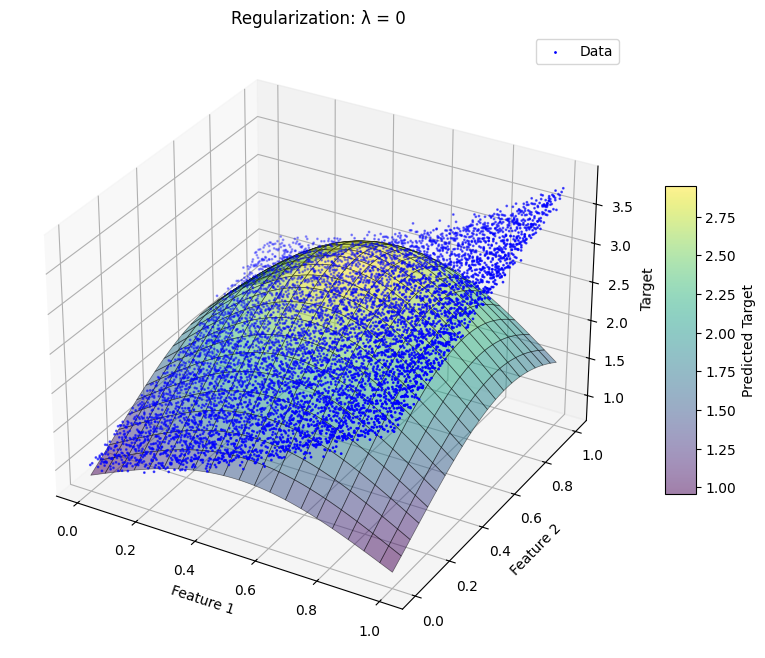

In [15]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0]
model_complexity=2
plot_approximation(X, y, model_complexity,reg_params)

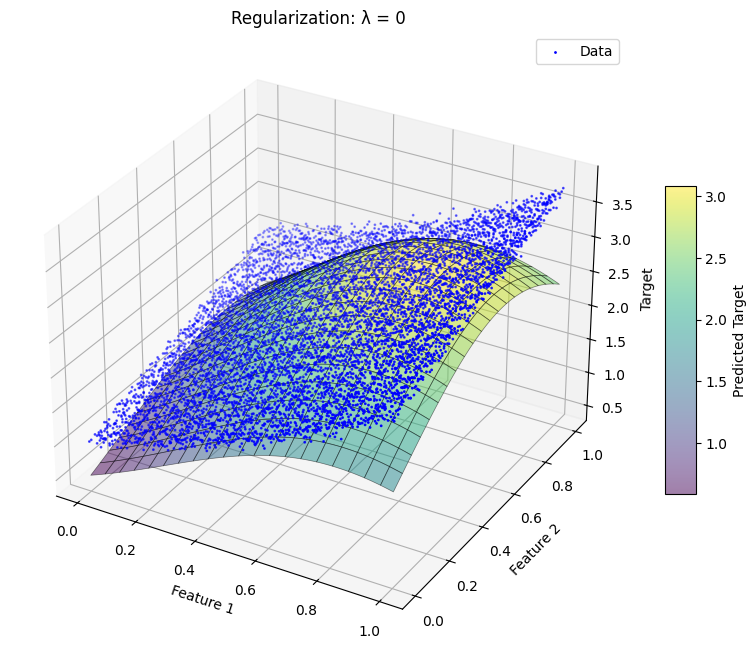

In [16]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0]
model_complexity=4
plot_approximation(X, y, model_complexity,reg_params)

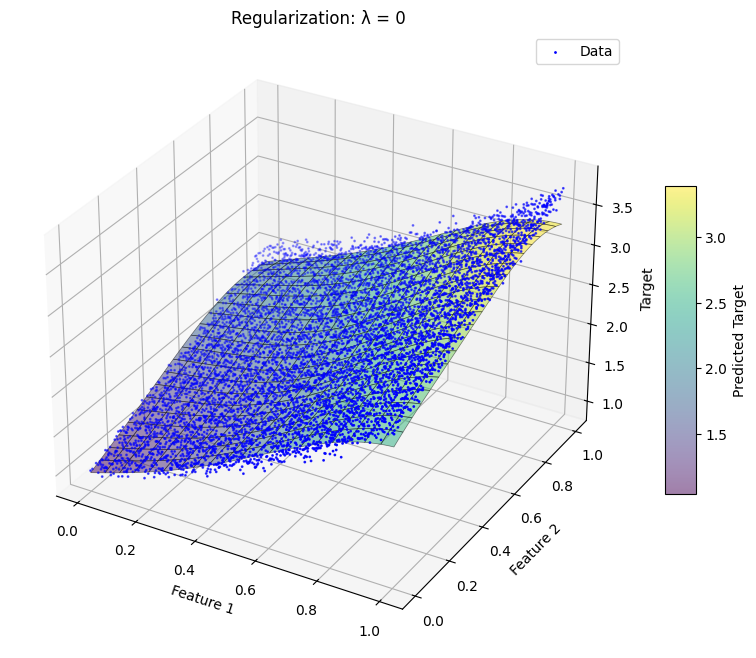

In [17]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0]
model_complexity=8
plot_approximation(X, y, model_complexity,reg_params)

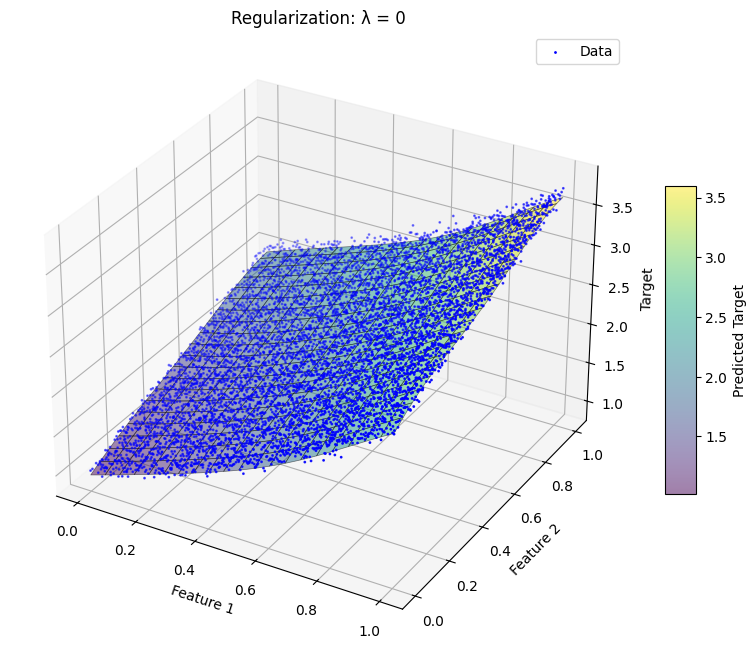

In [18]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0]
model_complexity=16
plot_approximation(X, y, model_complexity,reg_params)

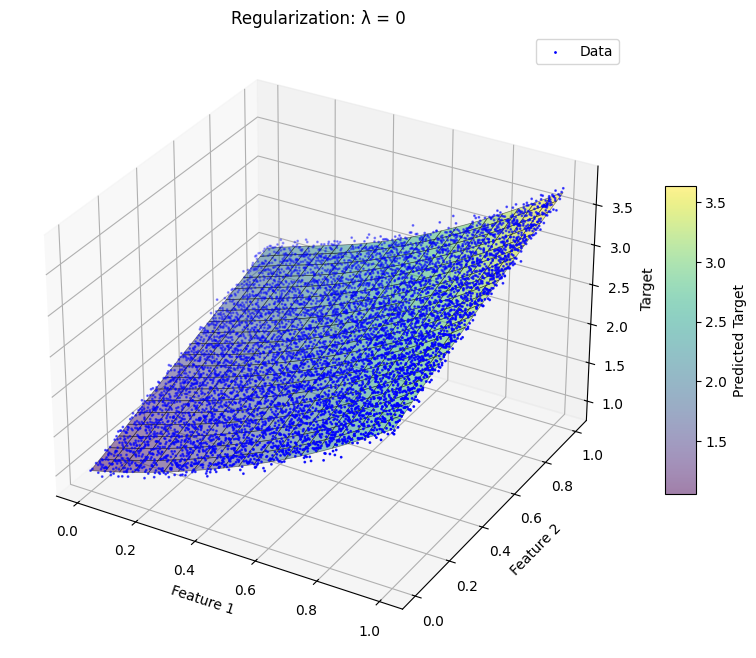

In [19]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0]
model_complexity=32
plot_approximation(X, y, model_complexity,reg_params)

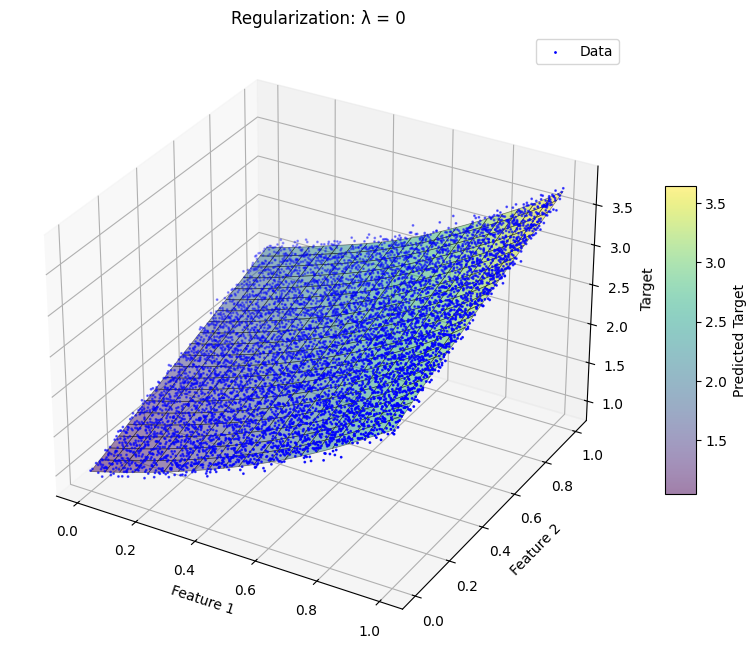

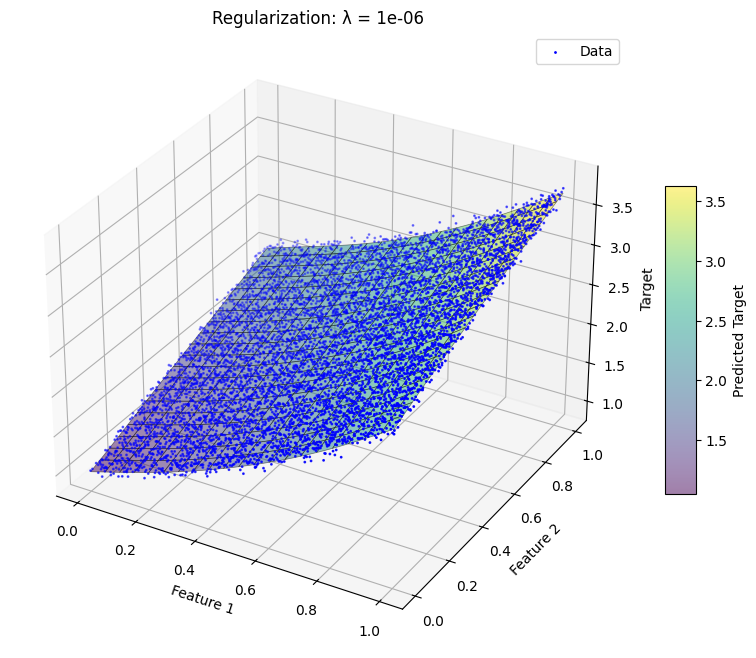

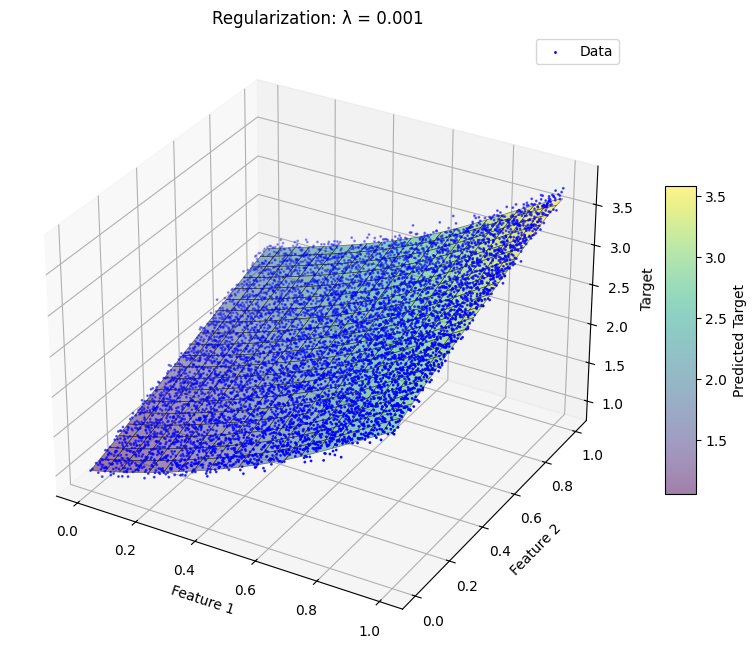

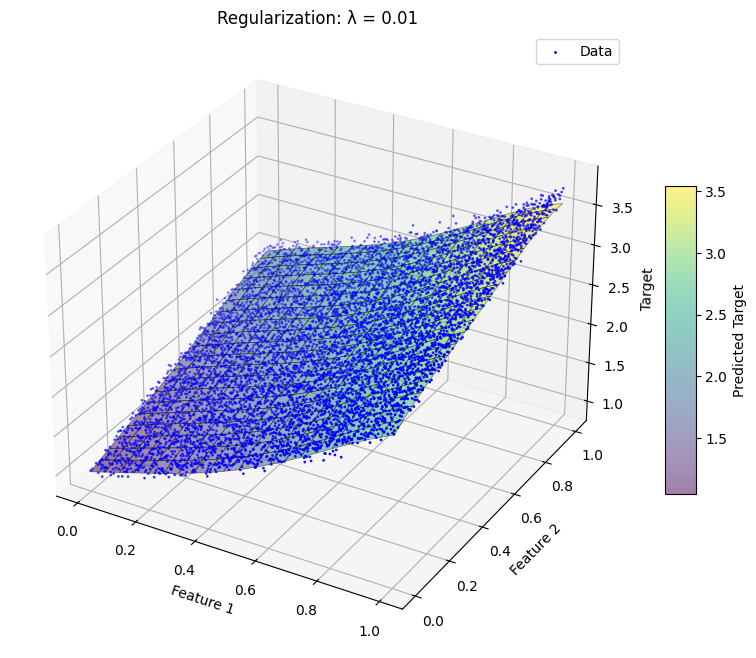

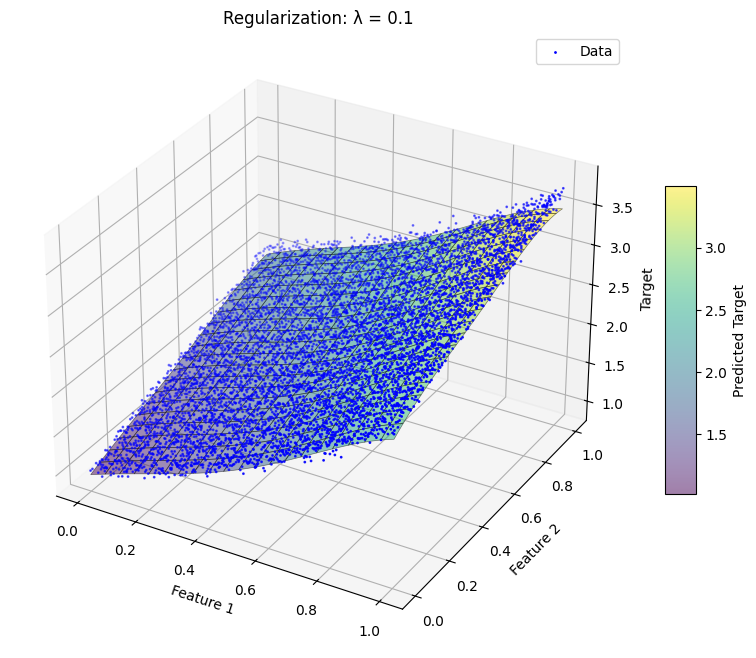

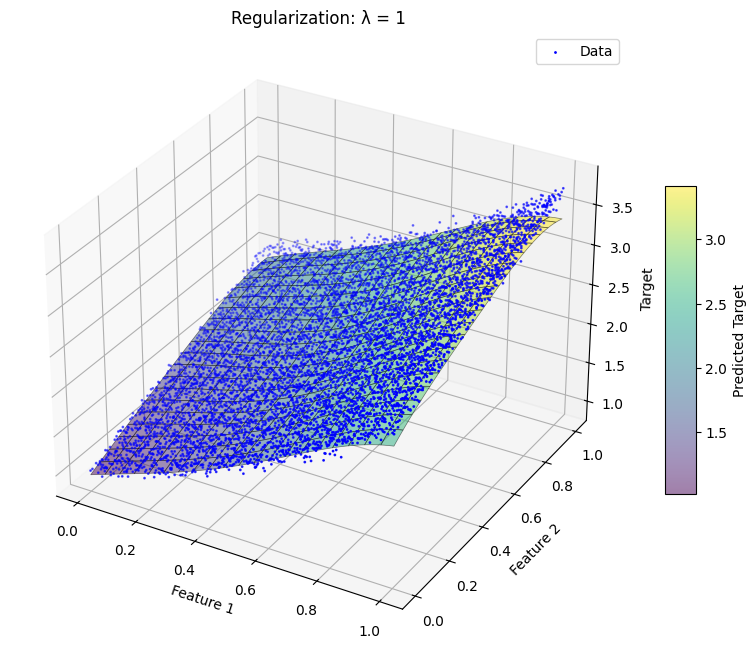

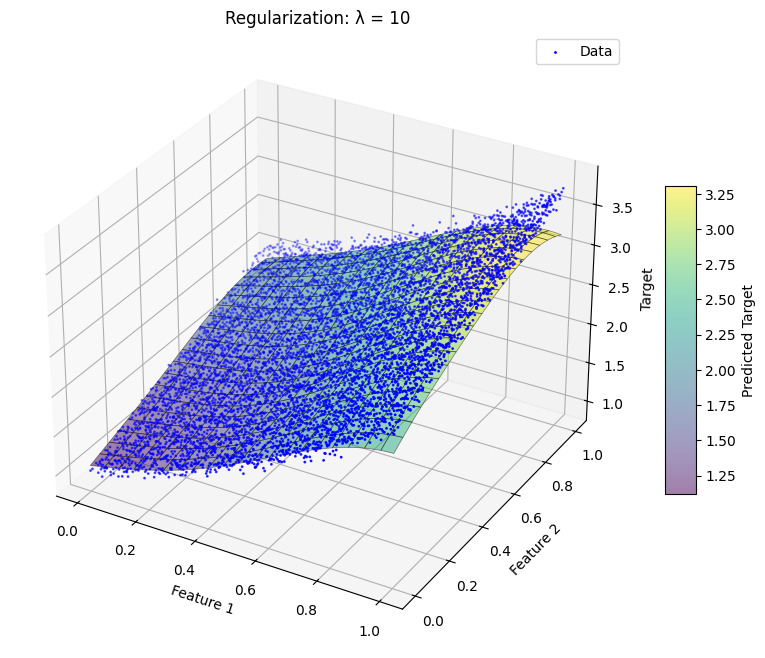

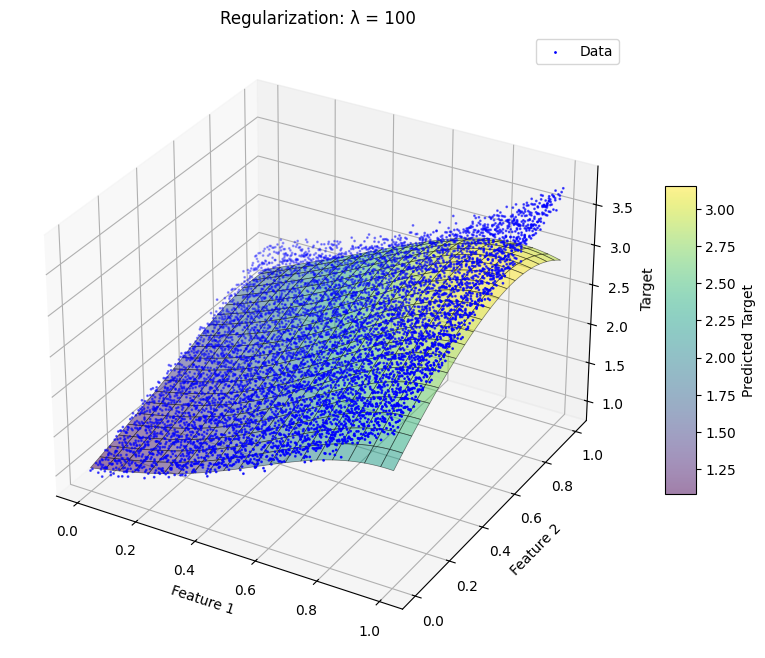

In [ ]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
model_complexity=128
plot_approximation(X, y, model_complexity,reg_params)

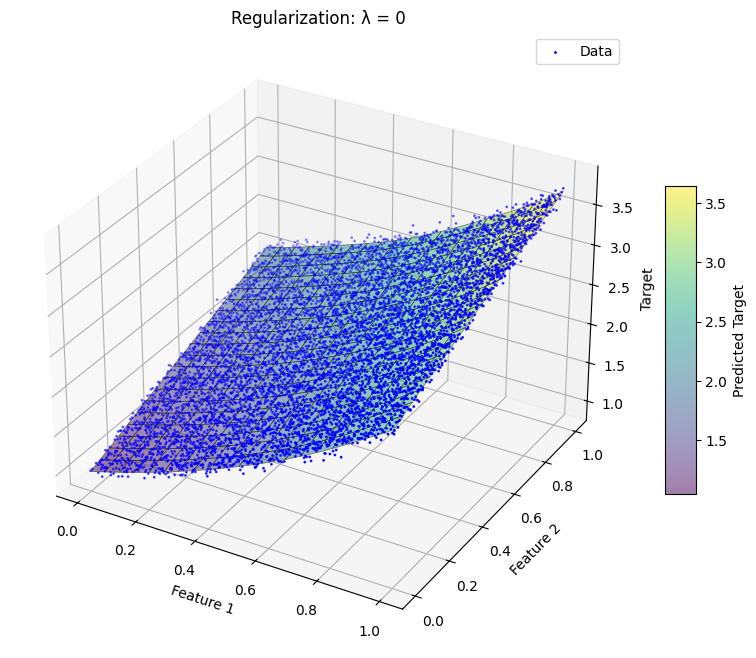

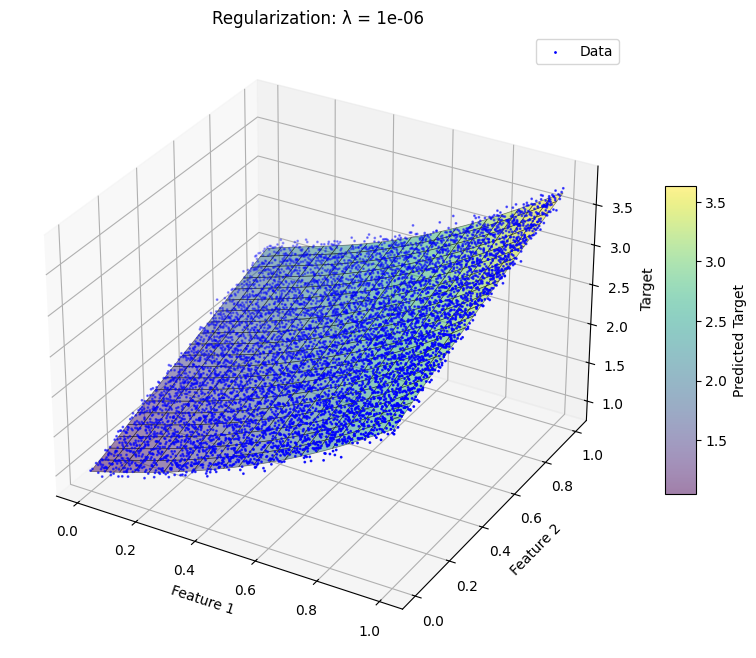

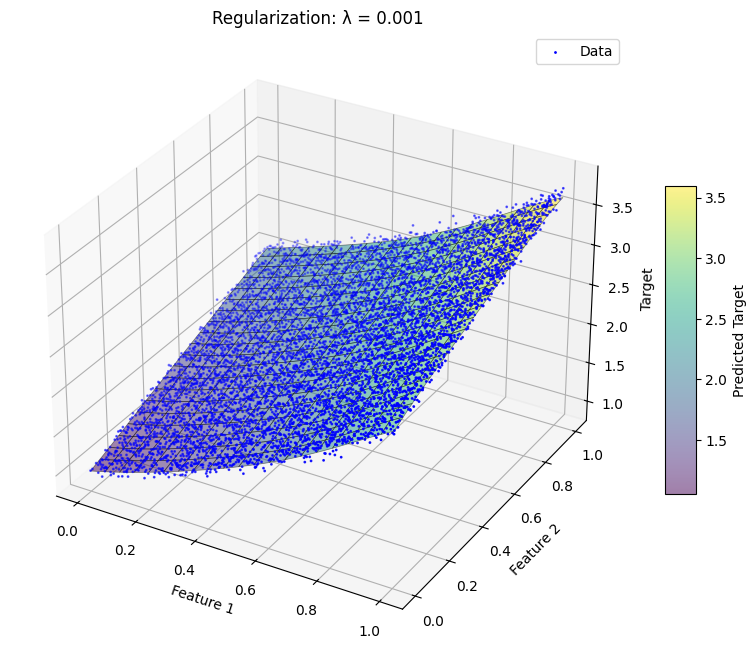

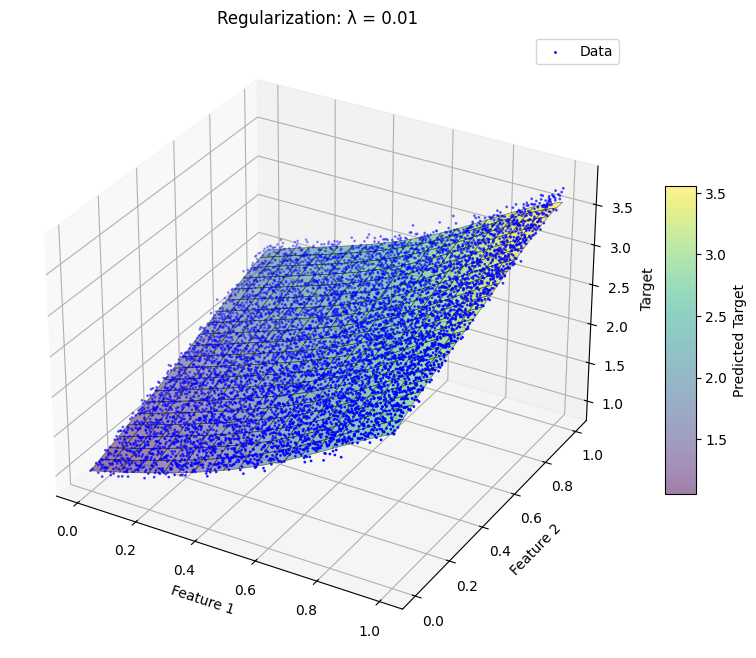

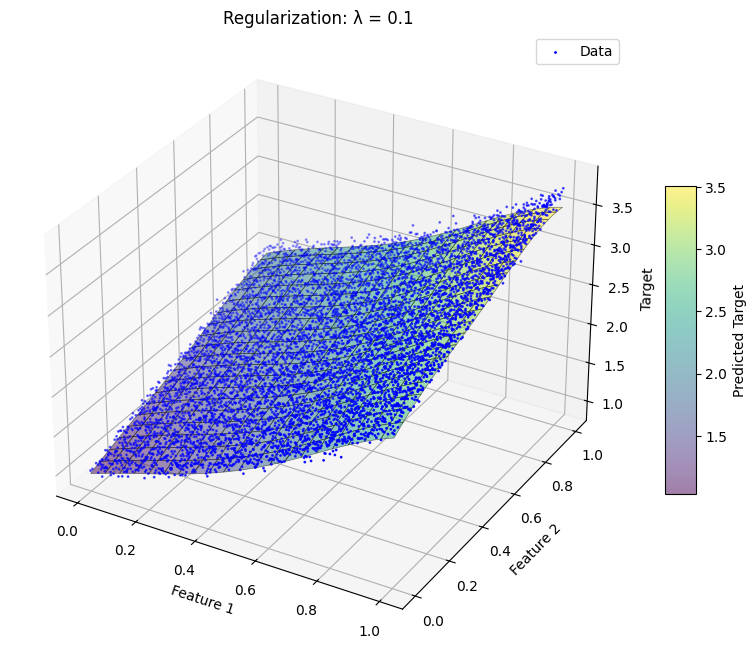

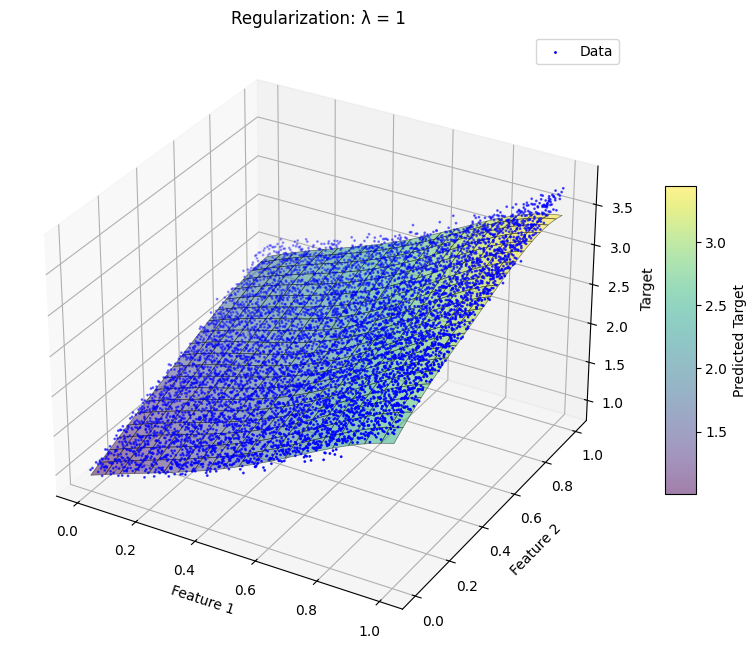

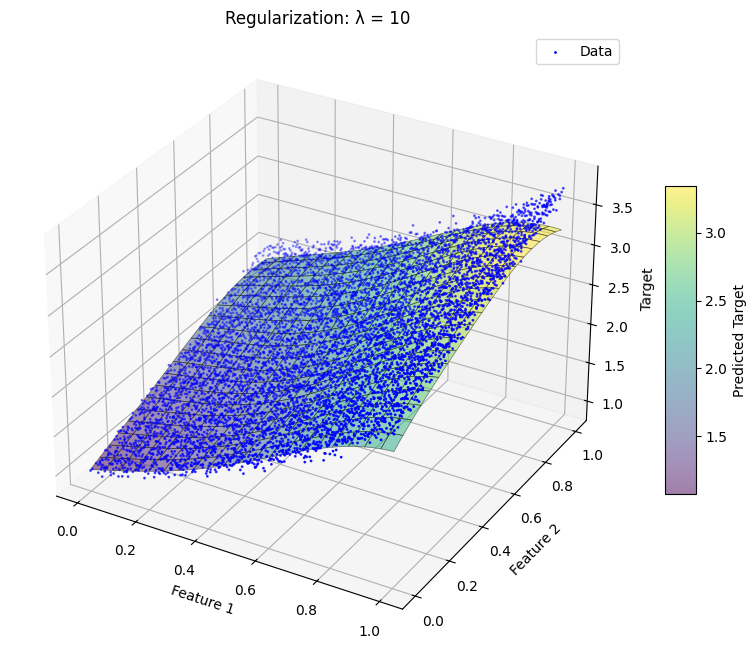

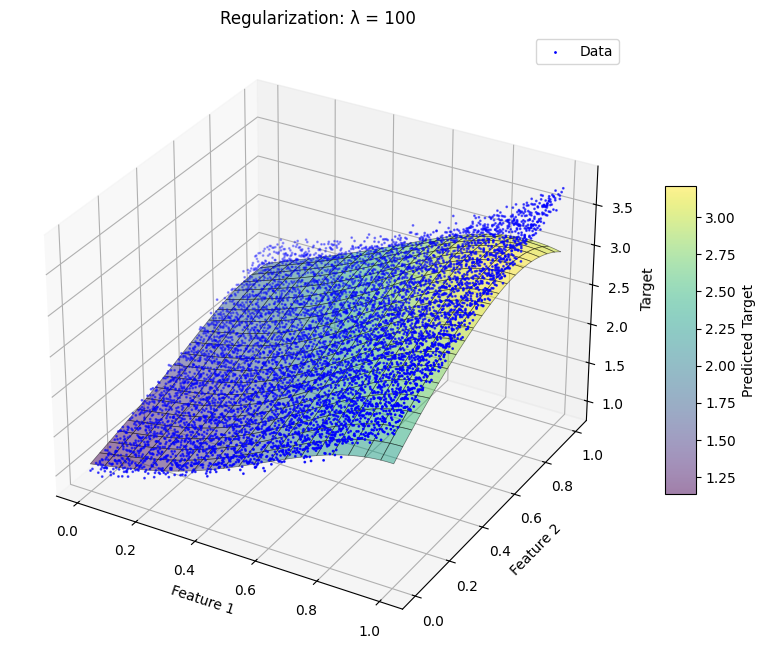

In [ ]:
X = df_X_train.to_numpy()  # Convert features to a NumPy array
y = df_y_train.to_numpy()  # Convert target to a NumPy array
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
model_complexity=256
plot_approximation(X, y, model_complexity,reg_params)

### MSE vs Complexity

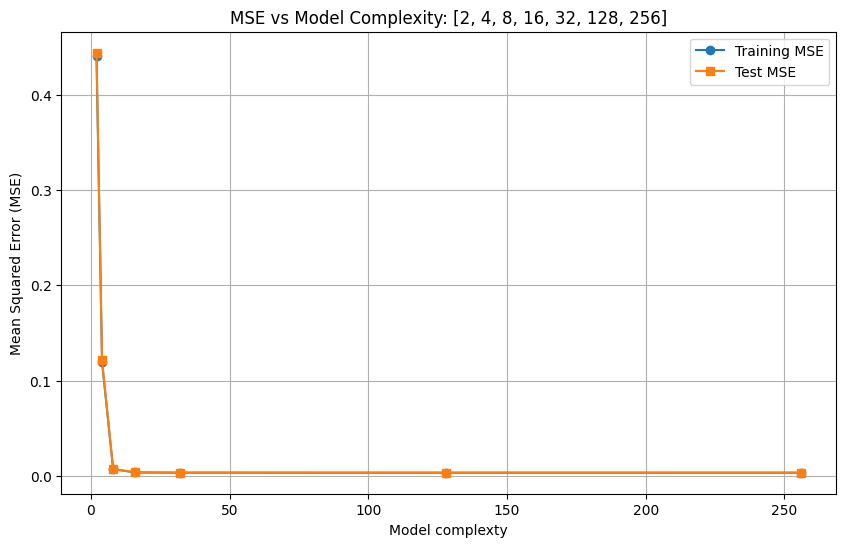

In [ ]:
from sklearn.metrics import mean_squared_error
def compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params=0):
    train_mse = []
    test_mse = []

    for complexity in model_complexity:
        reg_lambda = 0
        # Fit model on training data with fixed complexity and varying regularization
        w, centers, sigma = fit_gaussian_basis_regression(X_train, y_train, complexity, reg_lambda)

        # Predict on training and test data
        y_train_pred = predict(X_train, w, centers, sigma)
        y_test_pred = predict(X_test, w, centers, sigma)

        # Calculate MSE for training and test sets
        train_mse_value = mean_squared_error(y_train, y_train_pred)
        test_mse_value = mean_squared_error(y_test, y_test_pred)

        # Append to lists
        train_mse.append(train_mse_value)
        test_mse.append(test_mse_value)

    return train_mse, test_mse

def plot_mse_vs_complexity(train_mse, test_mse, complexity):
    plt.figure(figsize=(10, 6))

    # Plot MSE for training and test sets
    plt.plot(complexity, train_mse, label="Training MSE", marker='o')
    plt.plot(complexity, test_mse, label="Test MSE", marker='s')
    plt.xlabel("Model complexty")
    plt.ylabel("Mean Squared Error (MSE)")
    plt.title(f"MSE vs Model Complexity: {model_complexity}")
    plt.legend()
    plt.grid(True)
    plt.show()

model_complexity = [2,4,8,16,32,128,256]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, 0)

plot_mse_vs_complexity(train_mse, test_mse, model_complexity)

### Plots of MSE

In [ ]:
from sklearn.metrics import mean_squared_error

# Function to compute MSE for a fixed model complexity and varying regularization parameters
def compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params):
    train_mse = []
    test_mse = []

    for reg_lambda in reg_params:
        # Fit model on training data with fixed complexity and varying regularization
        w, centers, sigma = fit_gaussian_basis_regression(X_train, y_train, model_complexity, reg_lambda)

        # Predict on training and test data
        y_train_pred = predict(X_train, w, centers, sigma)
        y_test_pred = predict(X_test, w, centers, sigma)

        # Calculate MSE for training and test sets
        train_mse_value = mean_squared_error(y_train, y_train_pred)
        test_mse_value = mean_squared_error(y_test, y_test_pred)

        # Append to lists
        train_mse.append(train_mse_value)
        test_mse.append(test_mse_value)

        # Print the MSE values for current regularization parameter
        print(f"Regularization λ={reg_lambda}: Training MSE={train_mse_value:.5f}, Test MSE={test_mse_value:.5f}")

    return train_mse, test_mse

# Plotting function for MSE values
def plot_mse_for_reg_params(train_mse, test_mse, reg_params):
    plt.figure(figsize=(10, 6))

    # Plot MSE for training and test sets
    plt.plot(reg_params, train_mse, label="Training MSE", marker='o')
    plt.plot(reg_params, test_mse, label="Test MSE", marker='s')

    # Set logarithmic scale on x-axis if parameters span a large range
    plt.xscale("log")
    plt.xlabel("Regularization Parameter (λ)")
    plt.ylabel("Mean Squared Error (MSE)")
    plt.title(f"MSE vs Regularization Parameter for Model Complexity: {model_complexity}")
    plt.legend()
    plt.grid(True)
    plt.show()

Regularization λ=0: Training MSE=0.44063, Test MSE=0.44427
Regularization λ=1e-06: Training MSE=0.44063, Test MSE=0.44427
Regularization λ=0.001: Training MSE=0.44063, Test MSE=0.44427
Regularization λ=0.01: Training MSE=0.44063, Test MSE=0.44427
Regularization λ=0.1: Training MSE=0.44063, Test MSE=0.44427
Regularization λ=1: Training MSE=0.44063, Test MSE=0.44425
Regularization λ=10: Training MSE=0.44070, Test MSE=0.44418
Regularization λ=100: Training MSE=0.44527, Test MSE=0.44794


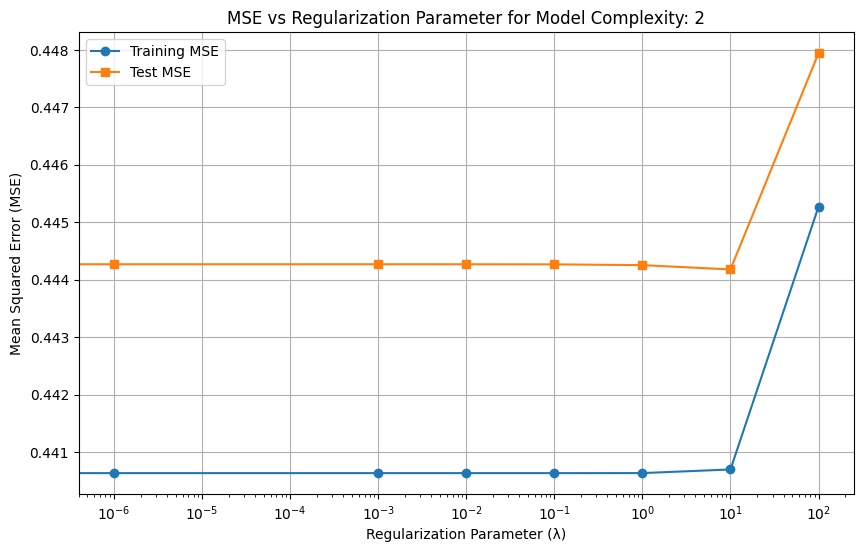

In [ ]:
model_complexity = 2
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.11926, Test MSE=0.12113
Regularization λ=1e-06: Training MSE=0.11926, Test MSE=0.12113
Regularization λ=0.001: Training MSE=0.11926, Test MSE=0.12113
Regularization λ=0.01: Training MSE=0.11926, Test MSE=0.12113
Regularization λ=0.1: Training MSE=0.11926, Test MSE=0.12113
Regularization λ=1: Training MSE=0.11926, Test MSE=0.12112
Regularization λ=10: Training MSE=0.11938, Test MSE=0.12113
Regularization λ=100: Training MSE=0.12769, Test MSE=0.12872


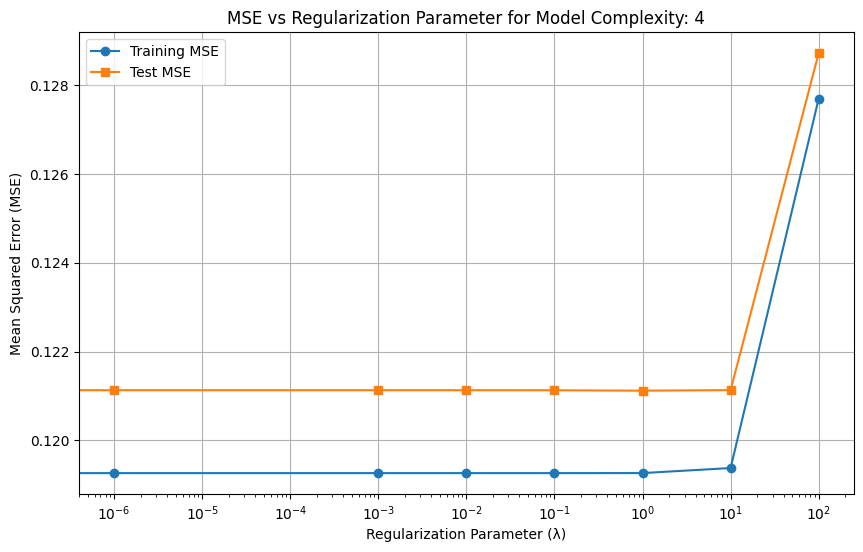

In [ ]:
model_complexity = 4
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.00700, Test MSE=0.00711
Regularization λ=1e-06: Training MSE=0.00700, Test MSE=0.00711
Regularization λ=0.001: Training MSE=0.00700, Test MSE=0.00711
Regularization λ=0.01: Training MSE=0.00700, Test MSE=0.00712
Regularization λ=0.1: Training MSE=0.00737, Test MSE=0.00754
Regularization λ=1: Training MSE=0.01087, Test MSE=0.01112
Regularization λ=10: Training MSE=0.04371, Test MSE=0.04424
Regularization λ=100: Training MSE=0.11296, Test MSE=0.11417


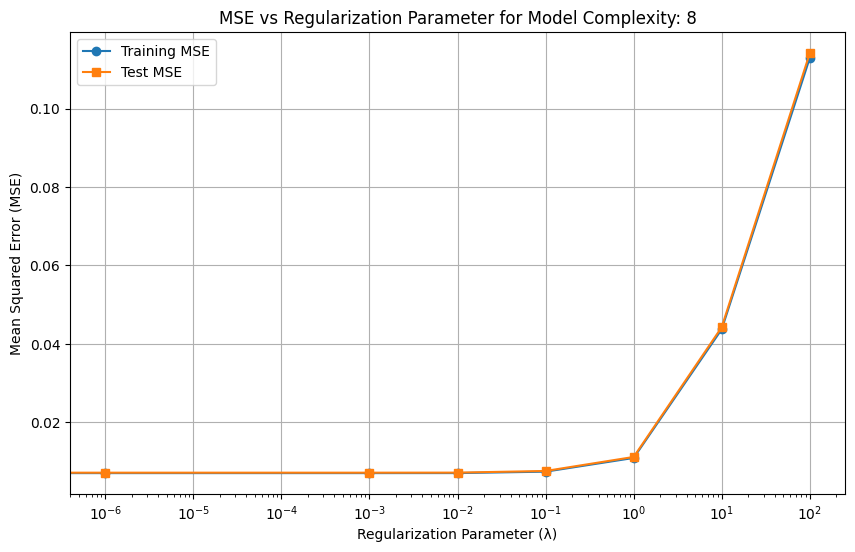

In [ ]:
model_complexity = 8
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.00348, Test MSE=0.00353
Regularization λ=1e-06: Training MSE=0.00348, Test MSE=0.00353
Regularization λ=0.001: Training MSE=0.00381, Test MSE=0.00383
Regularization λ=0.01: Training MSE=0.00397, Test MSE=0.00402
Regularization λ=0.1: Training MSE=0.00549, Test MSE=0.00561
Regularization λ=1: Training MSE=0.00833, Test MSE=0.00851
Regularization λ=10: Training MSE=0.01898, Test MSE=0.01919
Regularization λ=100: Training MSE=0.08616, Test MSE=0.08715


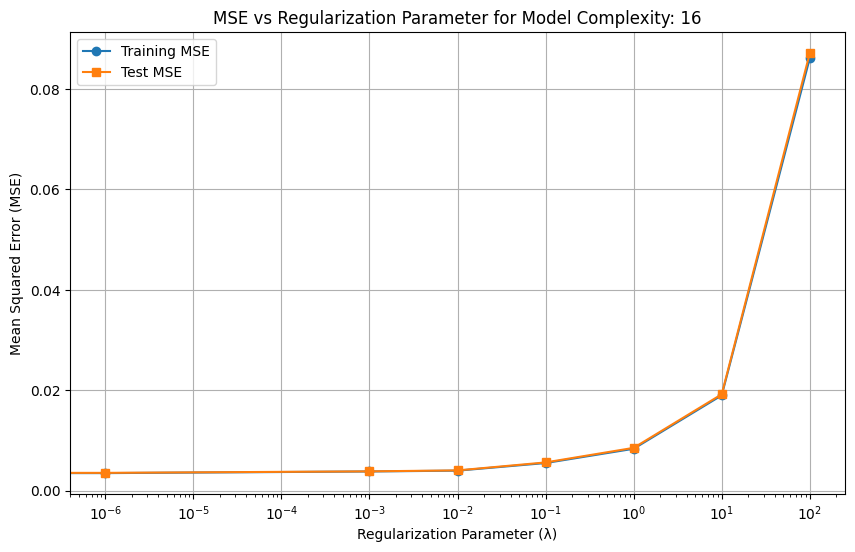

In [ ]:
model_complexity = 16
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.00325, Test MSE=0.00329
Regularization λ=1e-06: Training MSE=0.00322, Test MSE=0.00325
Regularization λ=0.001: Training MSE=0.00349, Test MSE=0.00351
Regularization λ=0.01: Training MSE=0.00383, Test MSE=0.00386
Regularization λ=0.1: Training MSE=0.00445, Test MSE=0.00452
Regularization λ=1: Training MSE=0.00709, Test MSE=0.00724
Regularization λ=10: Training MSE=0.01252, Test MSE=0.01270
Regularization λ=100: Training MSE=0.05792, Test MSE=0.05851


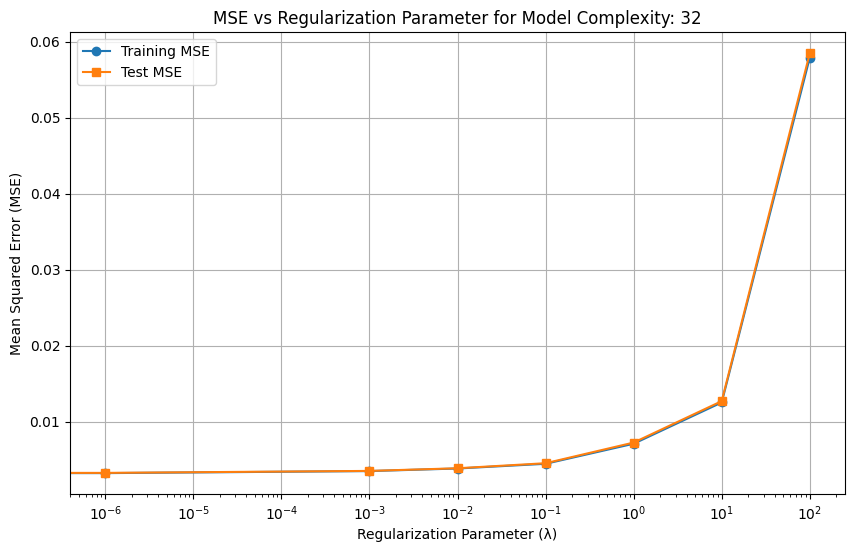

In [ ]:
model_complexity = 32
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.00320, Test MSE=0.00325
Regularization λ=1e-06: Training MSE=0.00321, Test MSE=0.00324
Regularization λ=0.001: Training MSE=0.00326, Test MSE=0.00328
Regularization λ=0.01: Training MSE=0.00352, Test MSE=0.00354
Regularization λ=0.1: Training MSE=0.00388, Test MSE=0.00391
Regularization λ=1: Training MSE=0.00490, Test MSE=0.00500
Regularization λ=10: Training MSE=0.00822, Test MSE=0.00838
Regularization λ=100: Training MSE=0.01936, Test MSE=0.01953


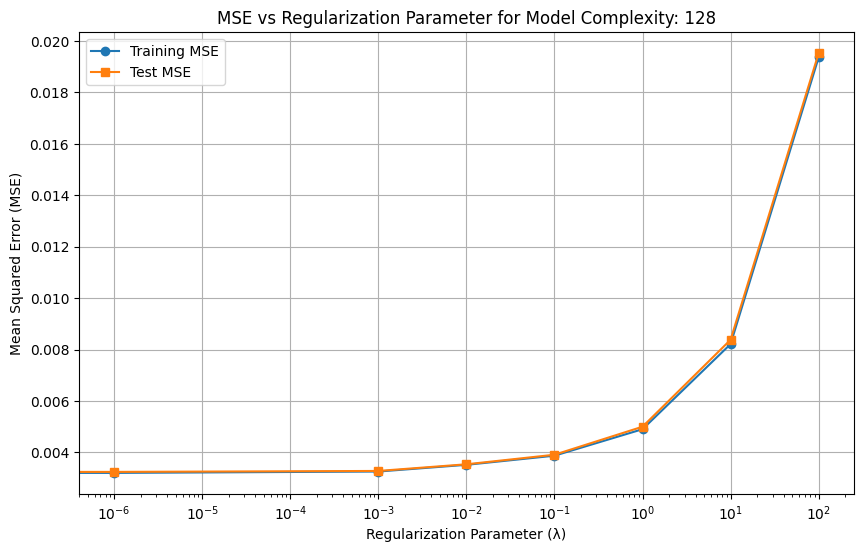

In [ ]:
model_complexity = 128
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

Regularization λ=0: Training MSE=0.00320, Test MSE=0.00325
Regularization λ=1e-06: Training MSE=0.00320, Test MSE=0.00325
Regularization λ=0.001: Training MSE=0.00324, Test MSE=0.00327
Regularization λ=0.01: Training MSE=0.00338, Test MSE=0.00340
Regularization λ=0.1: Training MSE=0.00380, Test MSE=0.00383
Regularization λ=1: Training MSE=0.00441, Test MSE=0.00448
Regularization λ=10: Training MSE=0.00704, Test MSE=0.00718
Regularization λ=100: Training MSE=0.01329, Test MSE=0.01345


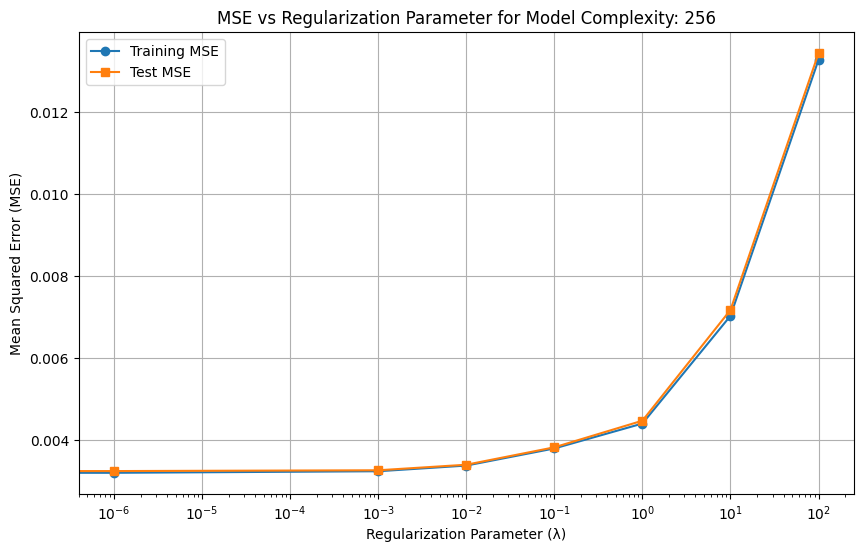

In [ ]:
model_complexity = 256
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
# Calculate MSE values
train_mse, test_mse = compute_mse_for_reg_params(X_train, y_train, X_test, y_test, model_complexity, reg_params)

# Plot the MSE values
plot_mse_for_reg_params(train_mse, test_mse, reg_params)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Function to compute MSE for given model complexity and regularization parameter
def compute_mse_for_complexity_and_reg(X_train, y_train, X_test, y_test, complexities, reg_params):
    train_mse = np.zeros((len(complexities), len(reg_params)))
    test_mse = np.zeros((len(complexities), len(reg_params)))

    for i, k in enumerate(complexities):
        for j, reg_lambda in enumerate(reg_params):
            # Fit model on training data with current complexity and regularization
            w, centers, sigma = fit_gaussian_basis_regression(X_train, y_train, k, reg_lambda)

            # Predict on training and test data
            y_train_pred = predict(X_train, w, centers, sigma)
            y_test_pred = predict(X_test, w, centers, sigma)

            # Calculate MSE for training and test sets
            train_mse[i, j] = mean_squared_error(y_train, y_train_pred)
            test_mse[i, j] = mean_squared_error(y_test, y_test_pred)

    return train_mse, test_mse

# Plotting function for MSE values
def plot_mse_heatmaps(train_mse, test_mse, complexities, reg_params):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Heatmap for Training MSE
    c1 = ax1.imshow(train_mse, interpolation='nearest', aspect='auto', cmap='viridis')
    ax1.set_title("Training MSE")
    ax1.set_xlabel("Regularization Parameter (λ)")
    ax1.set_ylabel("Model Complexity (Number of Basis Functions)")
    ax1.set_xticks(np.arange(len(reg_params)))
    ax1.set_yticks(np.arange(len(complexities)))
    ax1.set_xticklabels(reg_params)
    ax1.set_yticklabels(complexities)
    fig.colorbar(c1, ax=ax1)

    # Heatmap for Test MSE
    c2 = ax2.imshow(test_mse, interpolation='nearest', aspect='auto', cmap='viridis')
    ax2.set_title("Test MSE")
    ax2.set_xlabel("Regularization Parameter (λ)")
    ax2.set_ylabel("Model Complexity (Number of Basis Functions)")
    ax2.set_xticks(np.arange(len(reg_params)))
    ax2.set_yticks(np.arange(len(complexities)))
    ax2.set_xticklabels(reg_params)
    ax2.set_yticklabels(complexities)
    fig.colorbar(c2, ax=ax2)

    plt.tight_layout()
    plt.show()

# Example usage with sample complexities and regularization parameters
# Assuming X_train, y_train, X_test, and y_test have been defined
complexities = [2, 4, 8, 16, 32, 128,256 ]
reg_params=[0,1e-6,0.001,0.01,0.1,1,10,100]
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()

# Calculate MSE values
train_mse, test_mse = compute_mse_for_complexity_and_reg(X_train, y_train, X_test, y_test, complexities, reg_params)

# Plot the MSE values
plot_mse_heatmaps(train_mse, test_mse, complexities, reg_params)


### Best model complexity: 128 with regularization 0

Model Output and Target output vs Data point index

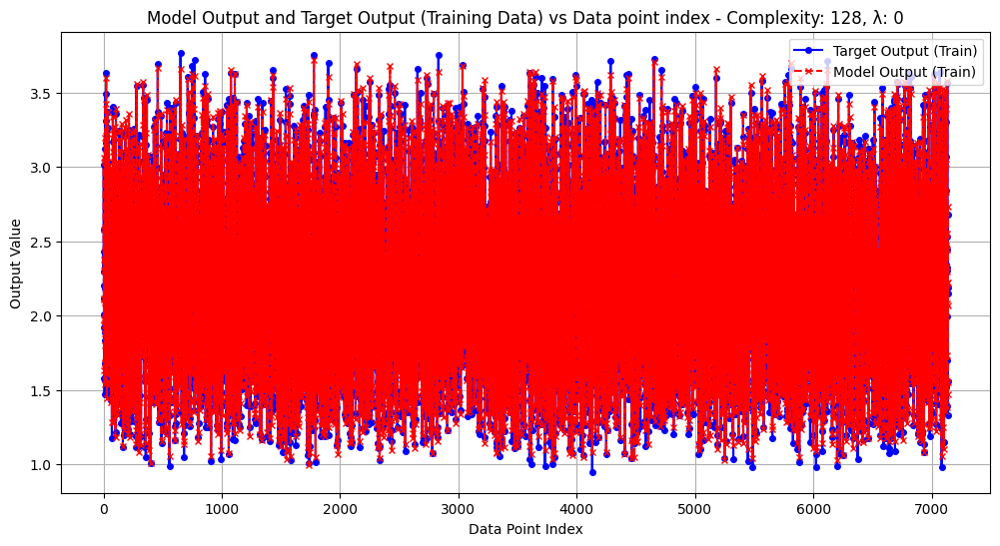

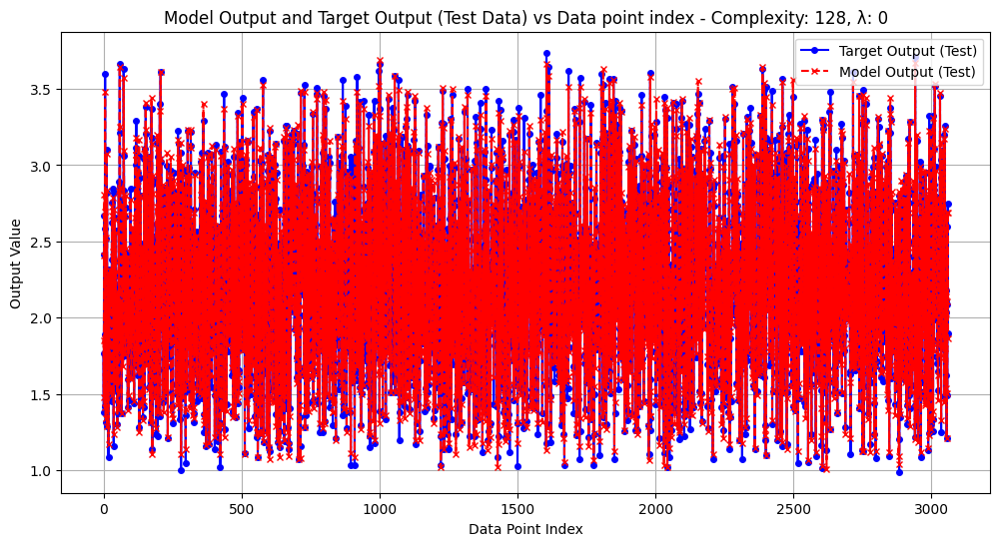

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming fit_gaussian_basis_regression and predict functions are defined
# fit_gaussian_basis_regression(X, y, model_complexity, reg_lambda) -> (w, centers, sigma)
# predict(X, w, centers, sigma) -> y_pred

def plot_model_and_target(X_train, y_train, X_test, y_test, model_complexity, reg_lambda):
    # Fit the model on training data
    w, centers, sigma = fit_gaussian_basis_regression(X_train, y_train, model_complexity, reg_lambda)

    # Generate predictions on training and test data
    y_train_pred = predict(X_train, w, centers, sigma)
    y_test_pred = predict(X_test, w, centers, sigma)

    # Plot model output vs target output for training data
    plt.figure(figsize=(12, 6))
    plt.plot(y_train, label="Target Output (Train)", color="blue", marker='o', linestyle='-', markersize=4)
    plt.plot(y_train_pred, label="Model Output (Train)", color="red", marker='x', linestyle='--', markersize=4)
    plt.xlabel("Data Point Index")
    plt.ylabel("Output Value")
    plt.title(f"Model Output and Target Output (Training Data) vs Data point index - Complexity: {model_complexity}, λ: {reg_lambda}")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot model output vs target output for test data
    plt.figure(figsize=(12, 6))
    plt.plot(y_test, label="Target Output (Test)", color="blue", marker='o', linestyle='-', markersize=4)
    plt.plot(y_test_pred, label="Model Output (Test)", color="red", marker='x', linestyle='--', markersize=4)
    plt.xlabel("Data Point Index")
    plt.ylabel("Output Value")
    plt.title(f"Model Output and Target Output (Test Data) vs Data point index - Complexity: {model_complexity}, λ: {reg_lambda}")
    plt.legend()
    plt.grid(True)
    plt.show()
X_train=df_X_train.to_numpy()
y_train=df_y_train.to_numpy()
X_test=df_X_test.to_numpy()
y_test=df_y_test.to_numpy()
plot_model_and_target(X_train, y_train, X_test, y_test, 128, 0)


Scatter Plot

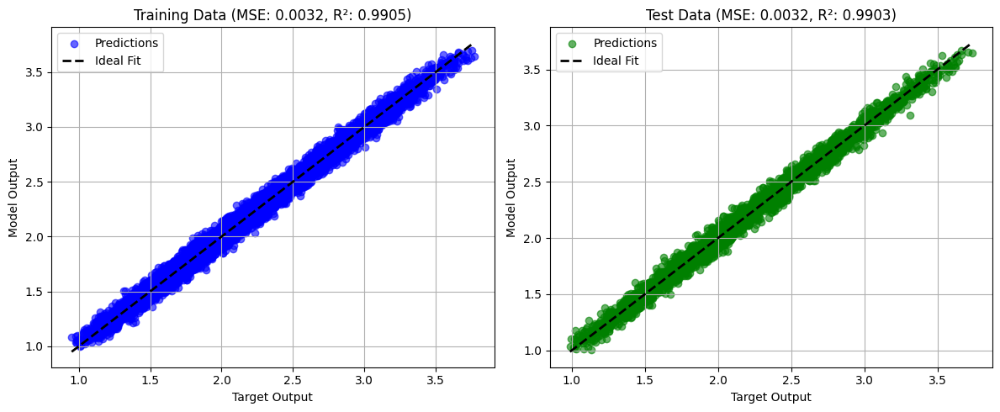

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

def plot_model_vs_target(X_train, y_train, X_test, y_test, model_complexity, reg_lambda):
    # Fit the model on training data
    w, centers, sigma = fit_gaussian_basis_regression(X_train, y_train, model_complexity, reg_lambda)

    # Predict on training and test data
    y_train_pred = predict(X_train, w, centers, sigma)
    y_test_pred = predict(X_test, w, centers, sigma)

    # Calculate metrics
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)

    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plot for Training Data
    axes[0].scatter(y_train, y_train_pred, color='blue', alpha=0.6, label='Predictions')
    axes[0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', linewidth=2, label='Ideal Fit')
    axes[0].set_xlabel("Target Output")
    axes[0].set_ylabel("Model Output")
    axes[0].set_title(f"Training Data (MSE: {train_mse:.4f}, R²: {train_r2:.4f})")
    axes[0].legend()
    axes[0].grid(True)

    # Plot for Test Data
    axes[1].scatter(y_test, y_test_pred, color='green', alpha=0.6, label='Predictions')
    axes[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', linewidth=2, label='Ideal Fit')
    axes[1].set_xlabel("Target Output")
    axes[1].set_ylabel("Model Output")
    axes[1].set_title(f"Test Data (MSE: {test_mse:.4f}, R²: {test_r2:.4f})")
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    plt.show()

plot_model_vs_target(X_train, y_train, X_test, y_test, model_complexity=128, reg_lambda=1e-6)


### Model complexity: 256, regularization: 1e-6

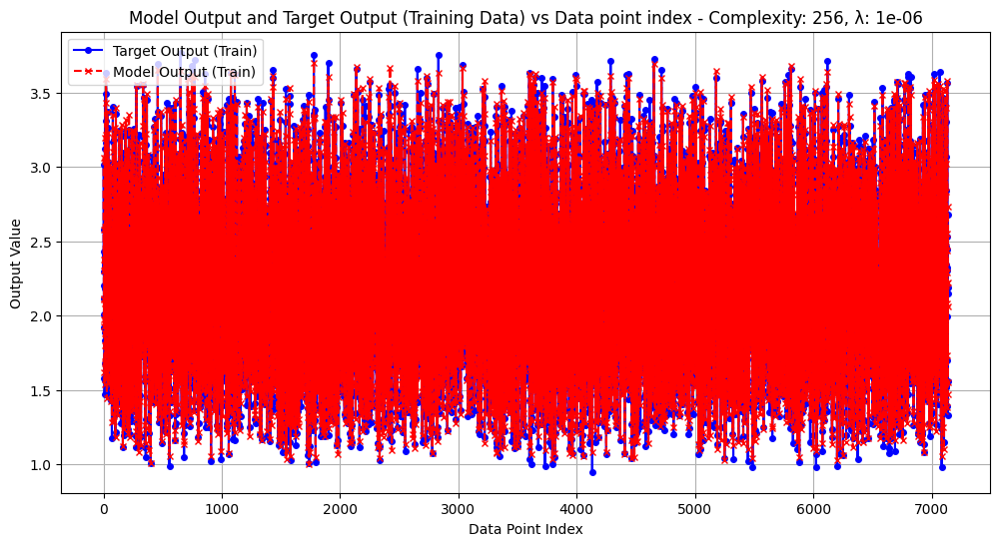

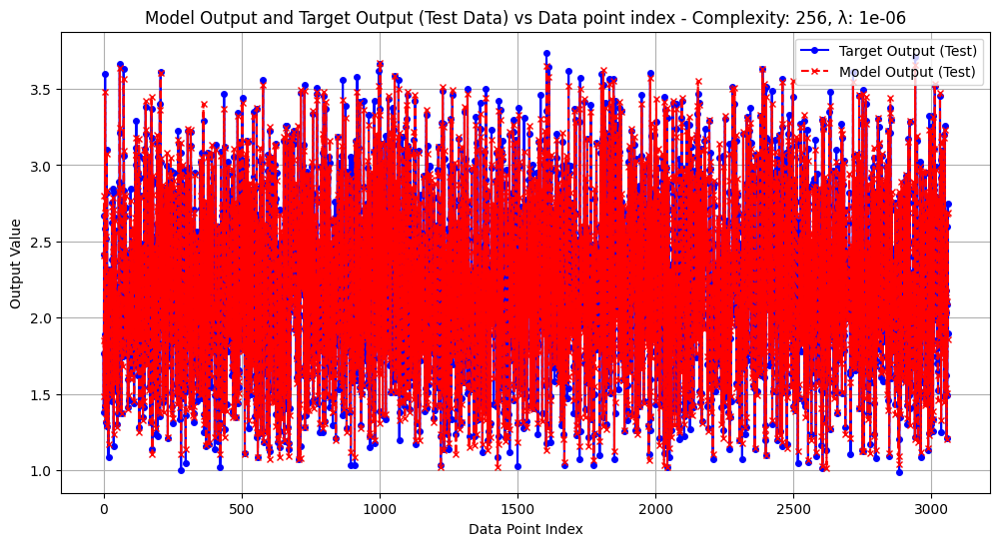

In [ ]:
plot_model_and_target(X_train, y_train, X_test, y_test, 256, 1e-6)

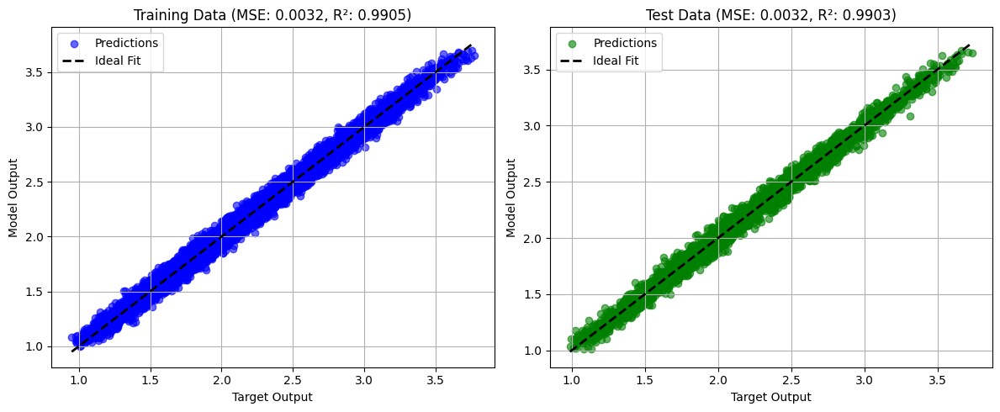

In [ ]:
plot_model_vs_target(X_train, y_train, X_test, y_test, model_complexity=256, reg_lambda=1e-6)